Scenario 2: Adversarial Attacks

Claudia is a machine learning engineer. She is responsible for developing and maintaining an image classification model. The model achieved outstanding training and testing accuracy at launch, but during a routine check, she discovers that the model has done quite a lot of misclassifications. Claudia does not find anything special of the misclassified images, but when she is inspecting the saliency maps of them, she notices that sometimes the attention of the model is a little bit scattered across irrelevant background regions. Consequently, she begins to suspect that the images have been attacked.

However, Claudia needs more evidence of diffused saliency exclusively happening on misclassified images. She wishes to retrieve top-k saliency maps for which the measures of dispersion are the highest, and their corresponding correctness of prediction. By using MaskSearch, she is able to quickly query these saliency maps, and confirms that almost all of them have incorrect classifications. She instantly reports the case of malicious attack and works towards improving the model’s resilience against it.

In this notebook, we will walkthrough the process in this scenario from beginning to end. The above description will be split and inserted below.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.io import read_image
from torchvision.models import resnet50, ResNet50_Weights
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pathlib import Path
from PIL import Image
import cv2
from pytorch_grad_cam import CAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import pickle
import shelve
import heapq
from operator import itemgetter

In [2]:
# Set main path to repo root directory
main = Path(".").resolve()
main

PosixPath('/homes/gws/hjyu/masksearch/ExplainAdversarial')

(1) Baseline

Claudia is a machine learning engineer. She is responsible for developing and maintaining an image classification model.

In [3]:
# Load imagenette trainset
transform=transforms.Compose([transforms.ToTensor(), transforms.Resize((400, 600))])
train_dataset = datasets.Imagenette(main/"data", size='full',
                                    split='train', transform=transform, download=False)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)

In [4]:
# Finetune ResNet50 on Imagenette
# weights = ResNet50_Weights.DEFAULT
# model = resnet50(weights=weights)

# print("CUDA Available: ", torch.cuda.is_available())
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = model.to(device)

# for param in model.parameters():
#     param.requires_grad = False
# model.fc = nn.Linear(model.fc.in_features, len(train_dataset.classes))
# model.train()

# criterion = nn.CrossEntropyLoss()
# optimizer = optim.SGD(model.fc.parameters(), lr=0.001, momentum=0.9)

# num_epochs = 2

# for epoch in range(num_epochs):
#     with tqdm(train_loader, desc=f"Train Ep {epoch + 1}", total=len(train_loader)) as tq:
#         for images, targets in tq:
#             x, y = images.to(device), targets.to(device)
#             optimizer.zero_grad()
#             y_hat = model(x)
#             loss = criterion(y_hat, y)
#             loss.backward()
#             optimizer.step()

# torch.save(model.state_dict(), main/"checkpoints/resnet50_imagenette.pth")

The model achieved outstanding training and testing accuracy at launch.

In [5]:
# Load imagenette testset
transform=transforms.Compose([transforms.ToTensor(), transforms.Resize((400, 600))])
test_dataset = datasets.Imagenette(main/"data", size='full',
                                   split='val', transform=transform, download=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=False)

In [6]:
# Load checkpoint
checkpoint = torch.load(main/"checkpoints/resnet50_imagenette.pth")
model = resnet50()

print("CUDA Available: ", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

model.fc = nn.Linear(model.fc.in_features, len(test_dataset.classes))
model.load_state_dict(checkpoint)
model.eval()

CUDA Available:  False


/homes/gws/hjyu/miniconda3/envs/masksearch/lib/python3.9/site-packages/torch/cuda/__init__.py:141: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11020). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# Evaluate ResNet50
all_predictions = []
all_labels = []
with tqdm(test_loader, desc=f"Eval", total=len(test_loader)) as tq:
    for images, targets in tq:
        with torch.no_grad():
            x, y = images.to(device), targets.to(device)
            predictions = model(x).argmax(1).tolist()
            labels = y.tolist()
            all_predictions += predictions
            all_labels += labels
all_predictions = torch.Tensor(all_predictions)
all_labels = torch.Tensor(all_labels)
accuracy = torch.sum(torch.eq(all_predictions, all_labels)).item() / all_predictions.size(-1)
# Accuracy = 0.979108280254777
print(f"Accuracy: {accuracy}")

(2) Perturbation

During a routine check, she discovers that the model has done quite a lot of misclassifications. (Pretend Claudia does not see the process of perturbation but know the final accuracy drops.)

In [7]:
def fgsm_attack(image, epsilon, data_grad):
    sign_data_grad = data_grad.sign()
    perturbed_image = image + epsilon * sign_data_grad
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    return perturbed_image

In [8]:
# Define custom dataset that additionally returns image path
class ImagenettePath(datasets.Imagenette):
    def __getitem__(self, idx):
        path, label = self._samples[idx]
        image = Image.open(path).convert("RGB")
        if self.transform is not None:
            image = self.transform(image)
        if self.target_transform is not None:
            label = self.target_transform(label)
        return image, label, path

In [9]:
# Helper function that converts an image tensor to displayable format
def convert(input_image, multiply=False, BGR=False):
    multiplier = 255.0 if multiply else 1.0
    image = np.moveaxis(input_image[0].detach().cpu().numpy() * multiplier, 0, 2)
    if BGR:
        image = image[:, :, ::-1]
    return image

In [12]:
# Get a new copy of imagenette; then load testset with ImagenettePath
transform=transforms.Compose([transforms.ToTensor(), transforms.Resize((400, 600))])
perturbing_dataset = ImagenettePath(main/"perturbed_eps5e-2", size='full',
                                    split='val', transform=transform, download=False)
perturbing_loader = torch.utils.data.DataLoader(perturbing_dataset, batch_size=1, shuffle=False)

In [13]:
# Perturb images in testset; report accuracy
criterion = nn.CrossEntropyLoss()
epsilon = 0.05

all_predictions = []
all_labels = []
with tqdm(perturbing_loader, desc=f"Attack", total=len(perturbing_loader)) as tq:
    for image, target, path in tq:
        x, y = image.to(device), target.to(device)
        x.requires_grad = True
        y_hat = model(x)
        prediction = y_hat.argmax(1)
        if prediction.item() != y.item():
            continue

        loss = criterion(y_hat, target)
        model.zero_grad()
        loss.backward()
        perturbed_image = fgsm_attack(image, epsilon, image.grad.data)

        path_split = path[0].split("/")
        path_attacking = "/".join(path_split[:-1]) + "/" + path_split[-1][:-5] + "_attacked.JPEG"
        cv2.imwrite(path_attacking, convert(perturbed_image, multiply=True, BGR=True))

        perturbed_y_hat = model(perturbed_image)
        perturbed_prediction = perturbed_y_hat.argmax(1).tolist()
        label = y.tolist()

        all_predictions += perturbed_prediction
        all_labels += label
all_predictions = torch.Tensor(all_predictions)
all_labels = torch.Tensor(all_labels)
accuracy = torch.sum(torch.eq(all_predictions, all_labels)).item() / all_predictions.size(-1)
# Accuracy = 0.8084829560239396
print(f"Accuracy: {accuracy}")

Attack:   0%|          | 0/3925 [00:00<?, ?it/s]

Accuracy: 0.8084829560239396


(3) Finding the cause with MaskSearch

Claudia does not find anything special of the misclassified images, but when she is inspecting the saliency maps of them, she notices that sometimes the attention of the model is a little bit scattered across irrelevant background regions. Consequently, she begins to suspect that the images have been attacked.

In [16]:
# Load perturbed testset
transform=transforms.Compose([transforms.ToTensor(), transforms.Resize((400, 600))])
perturbed_dataset = ImagenettePath(main/"perturbed_eps5e-2", size='full',
                                   split='val', transform=transform, download=False)
perturbed_loader = torch.utils.data.DataLoader(perturbed_dataset, batch_size=1, shuffle=True)

Saliency:   0%|          | 0/7768 [00:00<?, ?it/s]

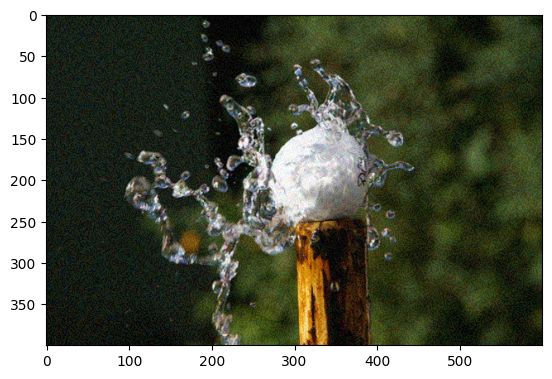

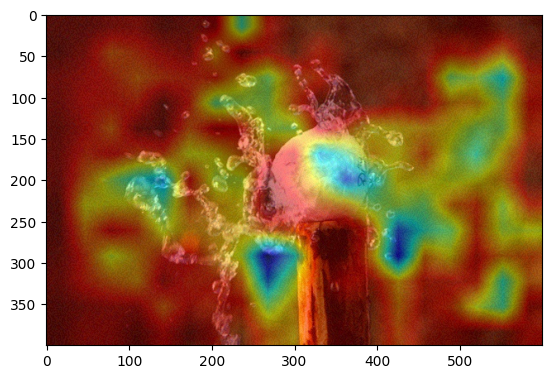

n03445777_10141_attacked.JPEG


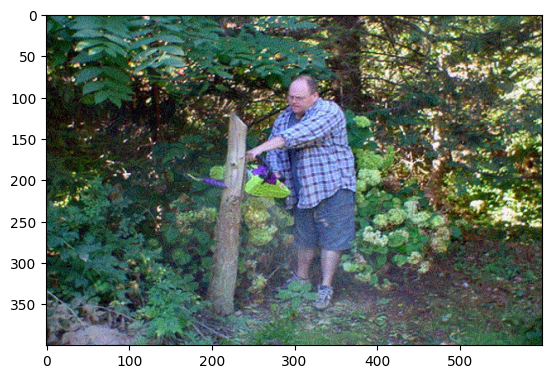

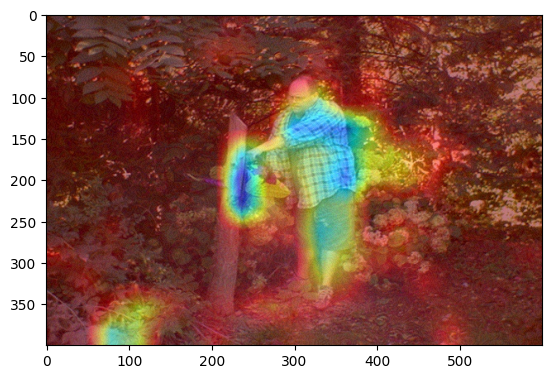

n03000684_19862_attacked.JPEG


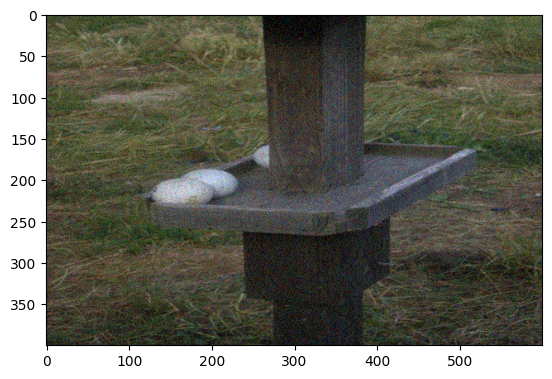

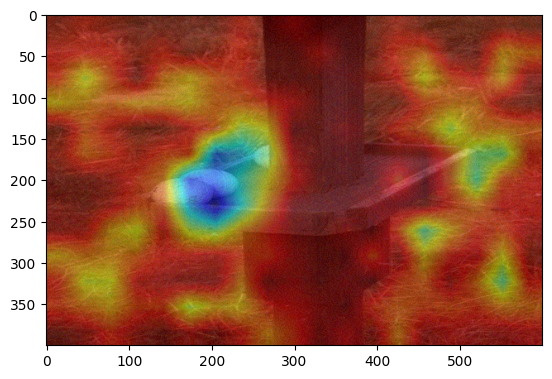

ILSVRC2012_val_00020502_attacked.JPEG


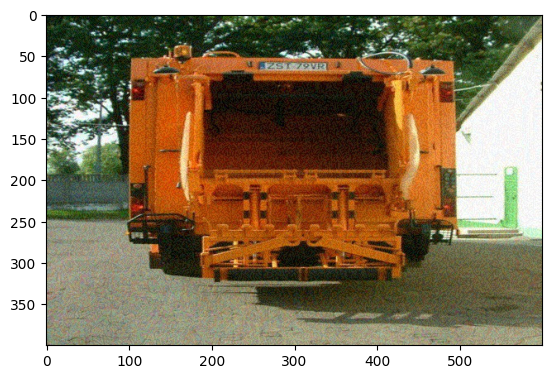

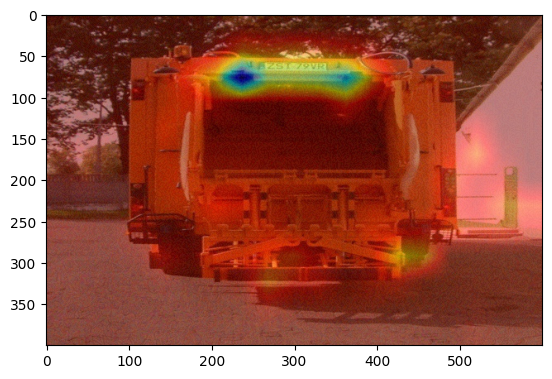

n03417042_29941_attacked.JPEG


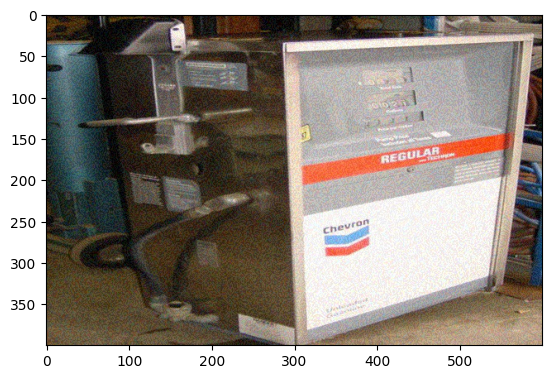

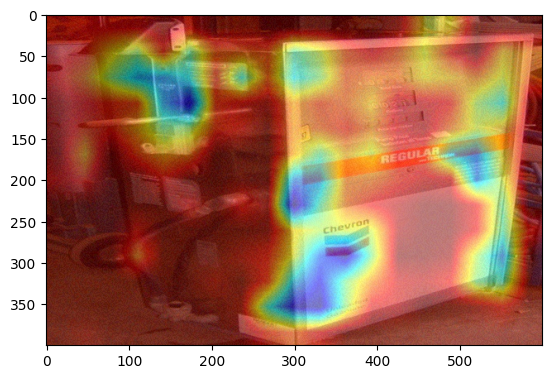

n03425413_26470_attacked.JPEG


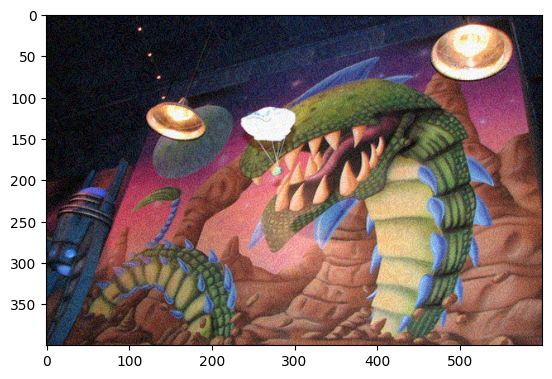

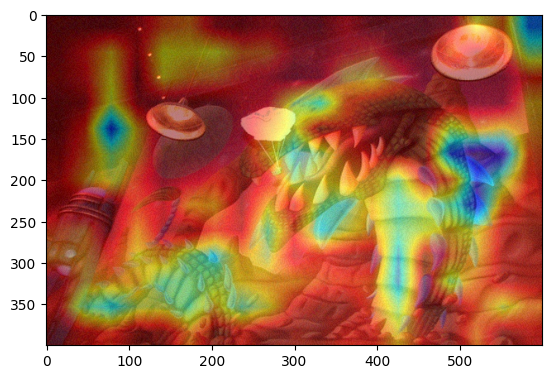

n03888257_5662_attacked.JPEG


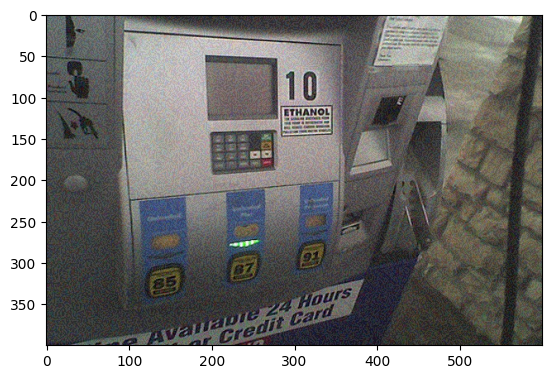

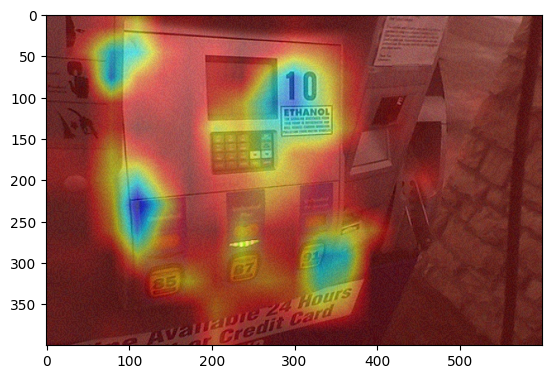

n03425413_12962_attacked.JPEG


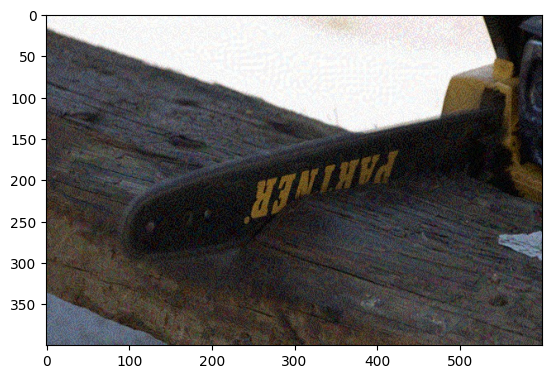

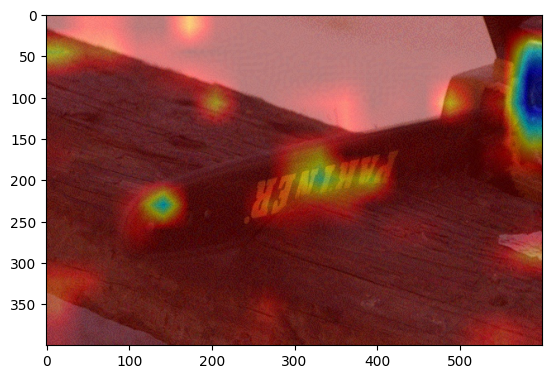

n03000684_9741_attacked.JPEG


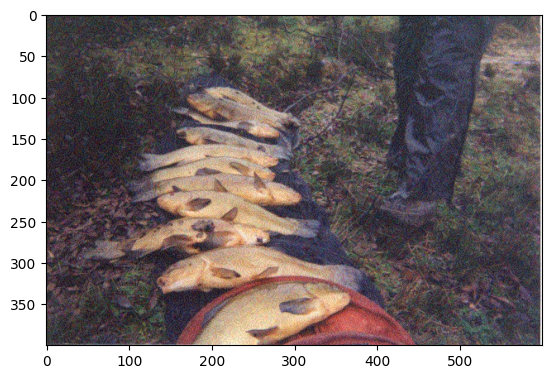

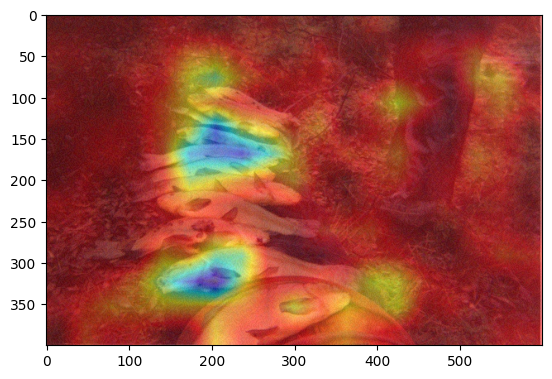

n01440764_8421_attacked.JPEG


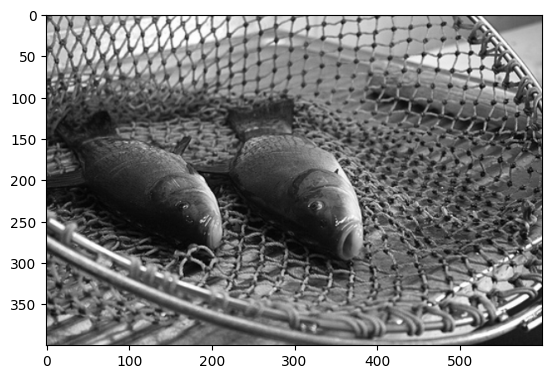

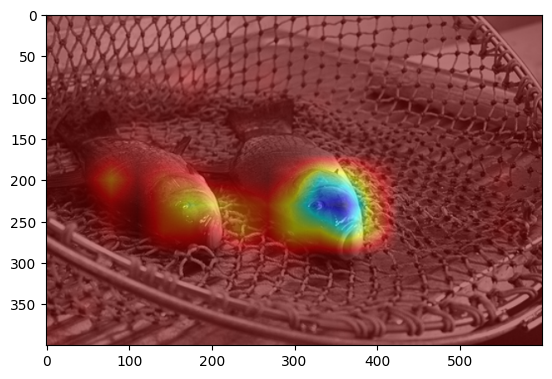

n01440764_15560.JPEG


In [17]:
# Inspect saliency maps of misclassified images
with tqdm(perturbed_loader, desc=f"Saliency", total=len(perturbed_loader)) as tq:
    i = 0
    for image, target, path in tq:
        x, y = image.to(device), target.to(device)
        x.requires_grad = False
        prediction = model(x).argmax(1)
        if prediction.item() != target.item():
            i += 1
            image.requires_grad = True
            target_layer = model.layer4[-1]
            cam = CAM(model=model,  target_layer=target_layer, use_cuda=torch.cuda.is_available())
            grayscale_cam = cam(input_tensor=image, target_category=target.item(), method="gradcam")
            converted_image = convert(image)
            plt.figure()
            plt.imshow(converted_image)
            plt.figure()
            visualization = show_cam_on_image(converted_image, grayscale_cam)
            plt.imshow(visualization)
            plt.show()
            print(path[0].split("/")[-1])
            if i == 10:
                break

However, Claudia needs more evidence of diffused saliency exclusively happening on misclassified images. She wishes to retrieve top-k saliency maps for which the measures of dispersion are the highest, and their corresponding correctness of prediction. By using MaskSearch, she is able to quickly query these saliency maps, and confirms that a large percent of them have incorrect classifications. She instantly reports the case of malicious attack and works towards improving the model’s resilience against it.

In [23]:
# Save everything we have now. 1000 images suffice.
image_data = []
cam_data = []
correctness_data = []

with tqdm(perturbed_loader, desc=f"Save", total=len(perturbed_loader)) as tq:
    target_layer = model.layer4[-1]
    cam = CAM(model=model,  target_layer=target_layer, use_cuda=torch.cuda.is_available())
    i = 0
    for image, target, path in tq:
        i += 1
        image.requires_grad = False
        prediction = model(image).argmax(1)
        image.requires_grad = True
        grayscale_cam = cam(input_tensor=image, target_category=target.item(), method="gradcam")
        image_data.append(convert(image))
        cam_data.append(grayscale_cam)
        correctness_data.append(prediction.item() == target.item())
        if i == 1000:
            break

image_file = open("serialized_eps5e-2/image_data.pkl", "wb")
cam_file = open("serialized_eps5e-2/cam_data.pkl", "wb")
correctness_file = open("serialized_eps5e-2/correctness_data.pkl", "wb")

pickle.dump(image_data, image_file, pickle.HIGHEST_PROTOCOL)
pickle.dump(cam_data, cam_file, pickle.HIGHEST_PROTOCOL)
pickle.dump(correctness_data, correctness_file, pickle.HIGHEST_PROTOCOL)

image_file.close()
cam_file.close()
correctness_file.close()

Save:   0%|          | 0/7768 [00:00<?, ?it/s]

/homes/gws/hjyu/miniconda3/envs/masksearch/lib/python3.9/site-packages/torch/nn/modules/module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


In [24]:
# Helper function that counts the pixels over a threshold in a region of a matrix
def dib(region, threshold):
    return (region > threshold).sum()

In [129]:
def compute_dispersion(cam, boundary=0.15, threshold=0.7):
    height, width = len(cam), len(cam[0])
    upper_bound, lower_bound = round(height * boundary), round(height * (1 - boundary))
    left_bound, right_bound = round(width * boundary), round(width * (1 - boundary))
    bkg_size = round(height * width * boundary * (4 - boundary * 4))
    upper_bkg, lower_bkg = cam[:upper_bound, :], cam[lower_bound:, :]
    left_bkg, right_bkg = cam[upper_bound:lower_bound, :left_bound], cam[upper_bound:lower_bound, right_bound:]
    return (dib(upper_bkg, threshold) + dib(lower_bkg, threshold) + dib(left_bkg, threshold) + dib(right_bkg, threshold)) / bkg_size

In [130]:
# Compute dispersion scores
dispersion_data = []

cam_file = open("serialized_eps5e-2/cam_data.pkl", "rb")
dispersion_file = open("serialized_eps5e-2/dispersion_data.pkl", "wb")

cam_data = pickle.load(cam_file)

for cam in cam_data:
    dispersion_data.append(compute_dispersion(cam))

pickle.dump(dispersion_data, dispersion_file, pickle.HIGHEST_PROTOCOL)

cam_file.close()
dispersion_file.close()

Misclassification rate in 1000 images: 0.10699999999999998
Misclassification rate in top 100: 0.12


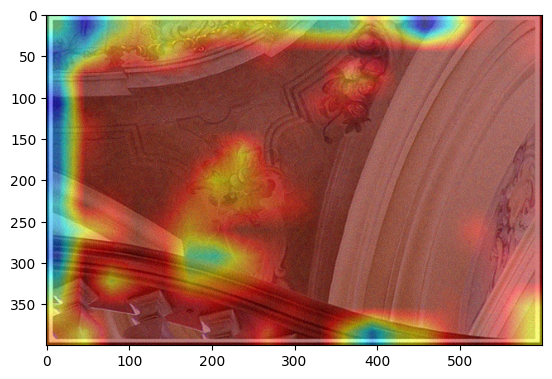

0.054485294117647055, False


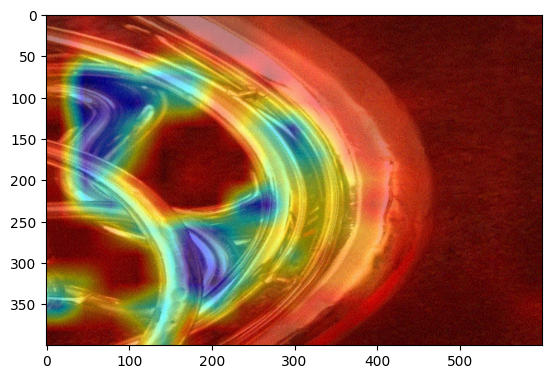

0.054133986928104574, True


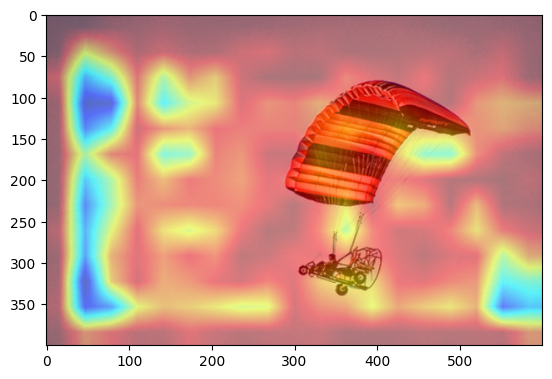

0.04779411764705882, True


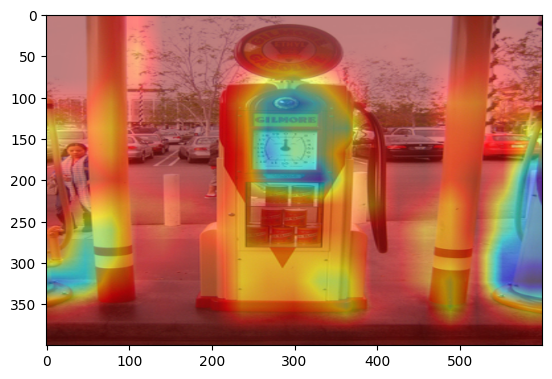

0.0426062091503268, True


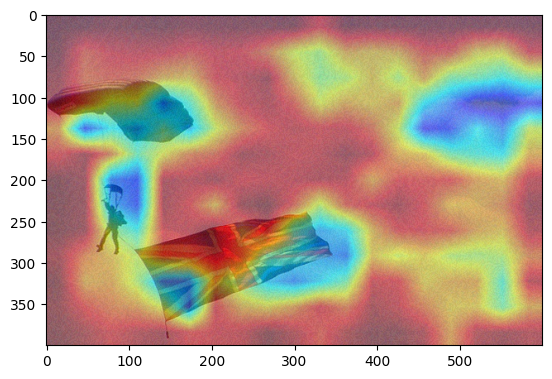

0.04029411764705882, True


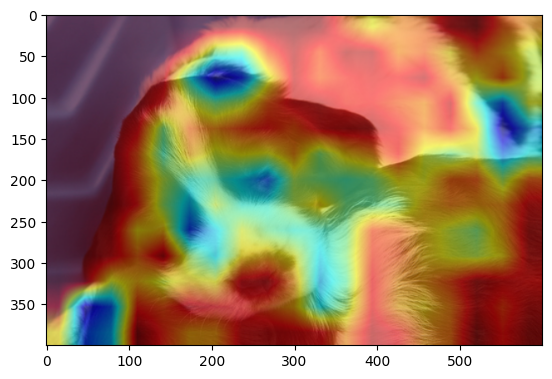

0.03839052287581699, True


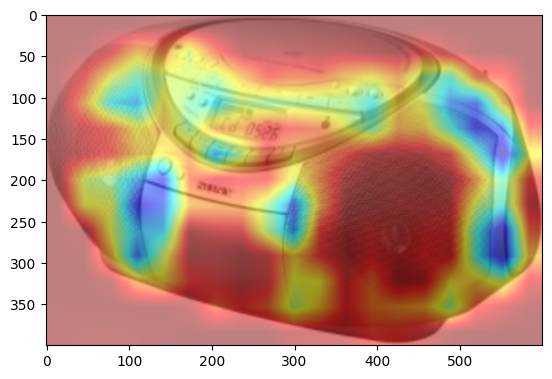

0.03790849673202614, True


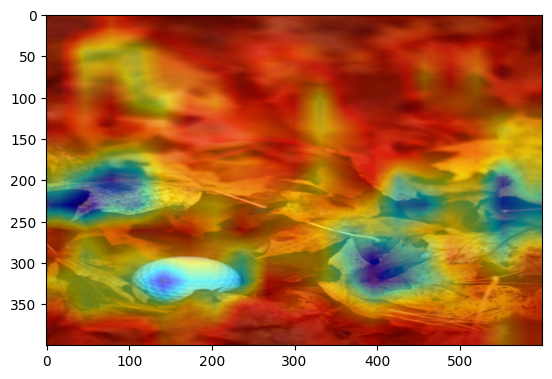

0.03686274509803922, True


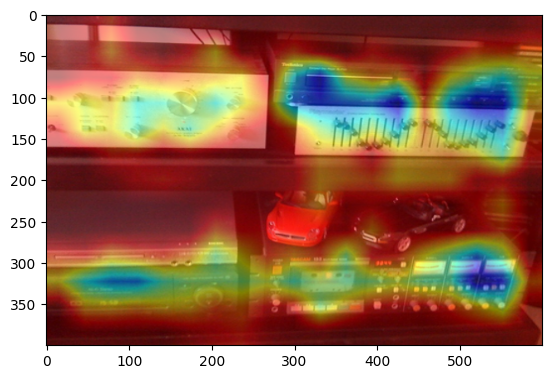

0.035898692810457516, True


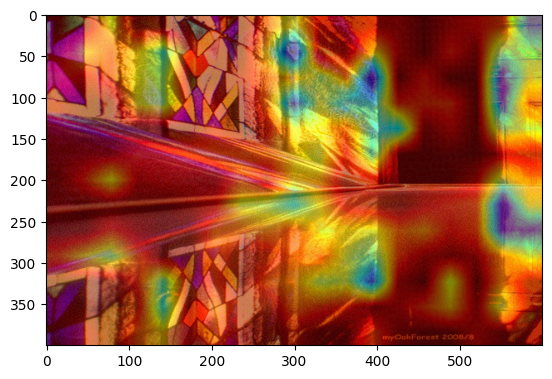

0.032205882352941174, False


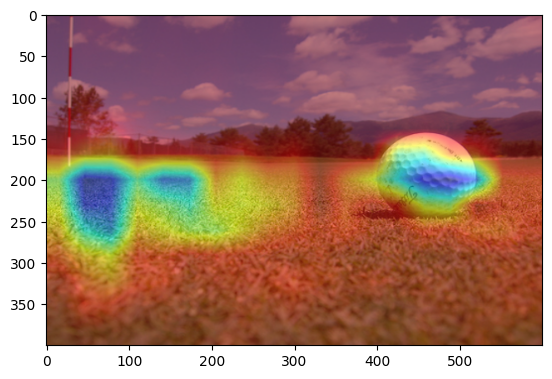

0.030882352941176472, True


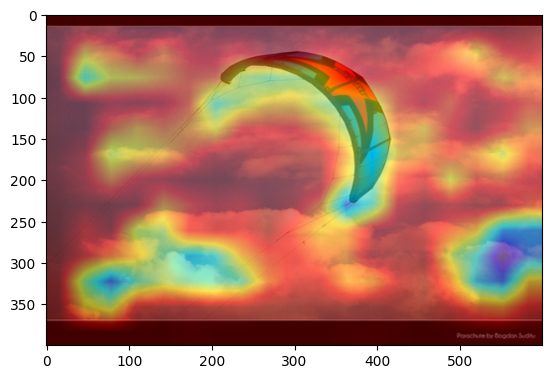

0.03053921568627451, True


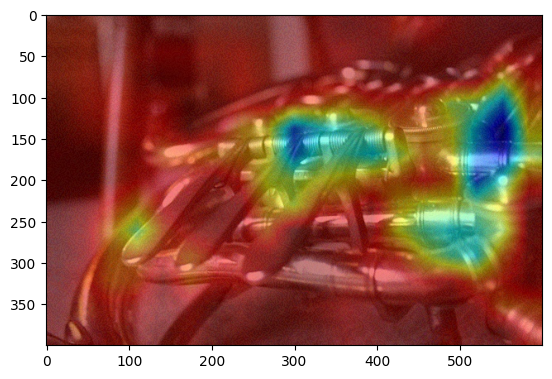

0.02977124183006536, True


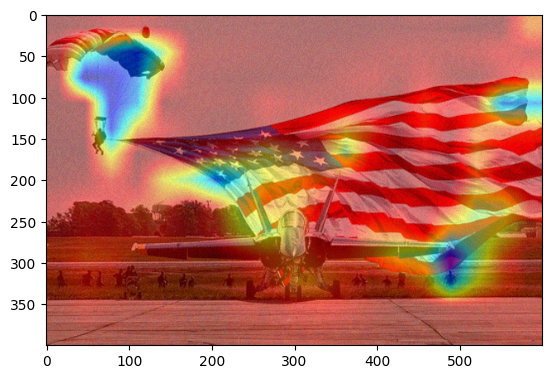

0.0297140522875817, True


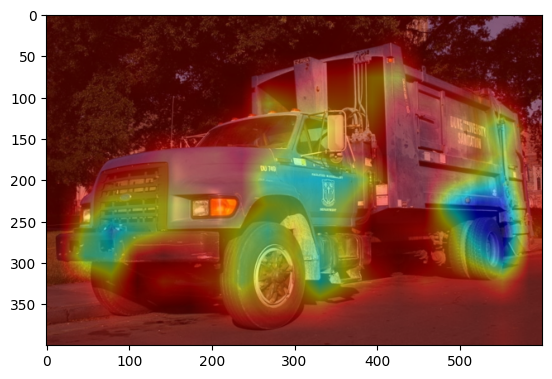

0.028676470588235293, True


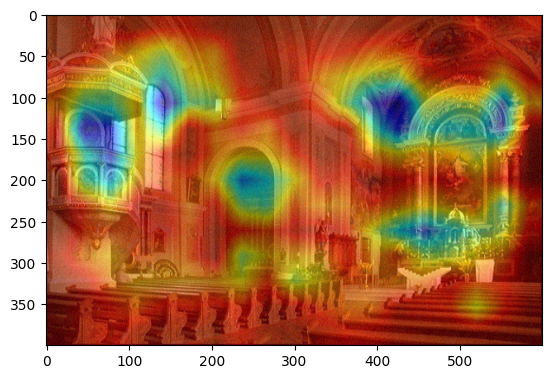

0.028308823529411765, True


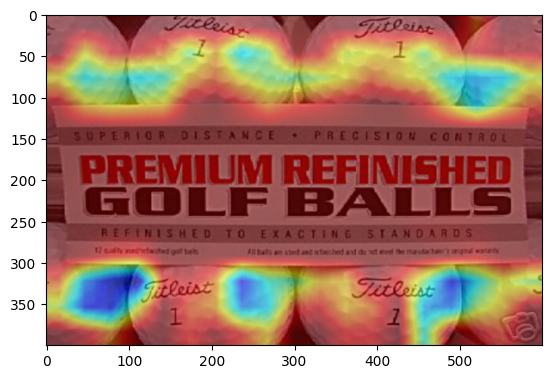

0.0277859477124183, True


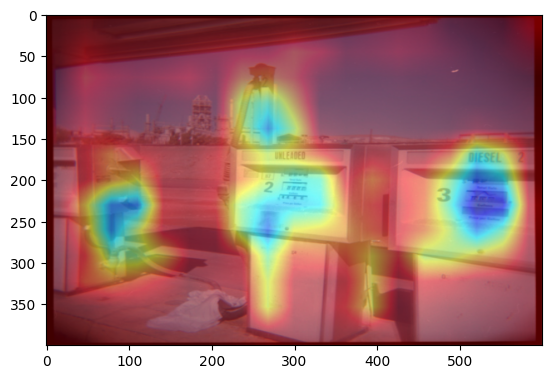

0.027687908496732028, True


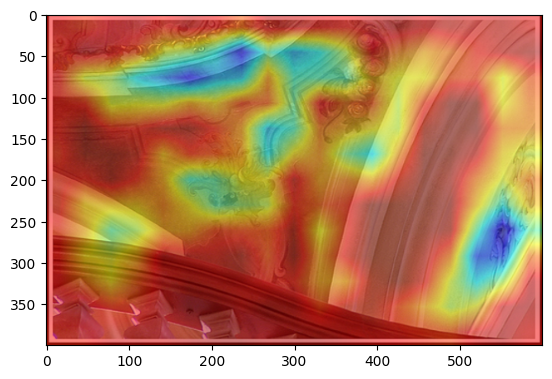

0.02636437908496732, True


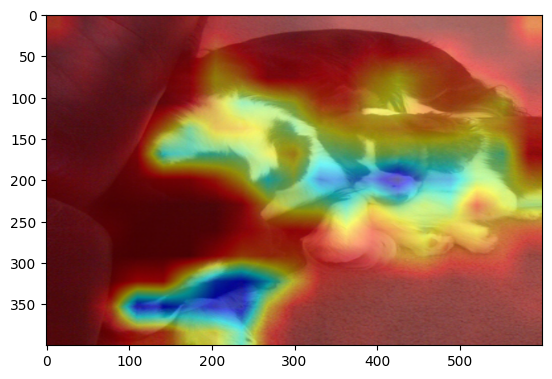

0.0252859477124183, True


In [131]:
# Load top-k results
image_file = open('serialized_eps5e-2/image_data.pkl', 'rb')
cam_file = open("serialized_eps5e-2/cam_data.pkl", "rb")
correctness_file = open("serialized_eps5e-2/correctness_data.pkl", "rb")
dispersion_file = open("serialized_eps5e-2/dispersion_data.pkl", "rb")

image_data = pickle.load(image_file)
cam_data = pickle.load(cam_file)
correctness_data = pickle.load(correctness_file)
dispersion_data = pickle.load(dispersion_file)

k = 100
top_k = heapq.nlargest(k, zip(image_data, cam_data, correctness_data, dispersion_data), key=itemgetter(3))
print(f"Misclassification rate in {len(correctness_data)} images: {1 - sum(correctness_data) / len(correctness_data)}")
print(f"Misclassification rate in top {k}: {1 - sum([entry[2] for entry in top_k]) / len(top_k)}")

i = 0
for image, cam, correctness, dispersion in top_k:
    i += 1
    plt.figure()
    plt.imshow(show_cam_on_image(image, cam))
    plt.show()
    print(f"{dispersion}, {correctness}")
    if i == 20:
        break

image_file.close()
cam_file.close()
correctness_file.close()
dispersion_file.close()